In [3]:
import numpy as np
import pandas as pd
import ot  # ot


In [4]:
# import all heartbeats
beatsJetCentered = np.loadtxt(r"C:\Users\fanga\OneDrive\Documents\Fall 2023\elec 594\THC Docs\Freddy's Code\Deliverables (2)\0.beatsJetCentered.csv", delimiter= ",")
beatsSinusCentered = np.loadtxt(r"C:\Users\fanga\OneDrive\Documents\Fall 2023\elec 594\THC Docs\Freddy's Code\Deliverables (2)\0.beatsSinusCentered.csv", delimiter = ",")

In [9]:
beatsSinusCentered.shape

(72061, 101)

In [5]:
# impory list of files in chronological order per patient.
fileList = pd.read_excel(r"C:\Users\fanga\OneDrive\Documents\Fall 2023\elec 594\THC Docs\Freddy's Code\Deliverables (2)\beatsChronological order.xlsx", header = None)

In [6]:
fileList.columns = ["Patient", "File", "Label"]

In [7]:
# Groupd heartbeat files per patient
filepd = fileList.groupby('Patient').agg({"File":list, "Label":list }).reset_index()

In [8]:
#Import data frame with indices of files
fileIdxSinus = pd.read_csv(r"C:\Users\fanga\OneDrive\Documents\Fall 2023\elec 594\THC Docs\Freddy's Code\Deliverables (2)\pdFilesIdxSinus.csv")
fileIdxJet = pd.read_csv(r"C:\Users\fanga\OneDrive\Documents\Fall 2023\elec 594\THC Docs\Freddy's Code\Deliverables (2)\pdFilesIdxJet.csv")

In [9]:
# Preprocess dataframe of file indices into a dictionary
fileIdxJetDict = fileIdxJet.set_index("File").T.to_dict('list')
fileIdxSinusDict = fileIdxSinus.set_index("File").T.to_dict('list')

In [10]:
# Total amount of imoported file recordings
len(fileIdxSinusDict) + len(fileIdxJetDict)

292

In [11]:
# Columns of dataframe containing information of each recording with its label
fileList.columns

Index(['Patient', 'File', 'Label'], dtype='object')

In [12]:
# The heartbeat recordings of some files that are mentioned in the chronological list were not actually processed due to 
# these recordings not being found in the dataset given. We will identify those file names and then ensure that 
# the created functions don't call these files to avoid "Not found key errors"

filesOriginal = fileList["File"]
noFoundFiles = []
for i in range(len(filesOriginal)) :
    if filesOriginal[i] not in fileIdxJetDict and filesOriginal[i] not in fileIdxSinusDict:
        noFoundFiles.append(filesOriginal[i])
noFoundFiles = set(noFoundFiles)

In [23]:
filepd.iterrows()


<generator object DataFrame.iterrows at 0x000002816818B450>

In [13]:
# Create dictionary mapping each patient to all of its SINUS and JET heartbeats 
patientArrays = {}
patientLabels = {}
for index, rows in filepd.iterrows():
    if len(set(rows["Label"])) == 1:
        continue
    patient = rows["Patient"]
    files = rows["File"]
    labels = rows["Label"]
    for i in range(len(files)):
        condition = labels[i]
        if files[i] in noFoundFiles: # if file is one of the "noFoundFiles", do nothing
            continue
        if condition == "SINUS":
            arr = beatsSinusCentered[fileIdxSinusDict[files[i]][0]:fileIdxSinusDict[files[i]][1] + 1]
            y = np.array([0 for i in range(len(arr))])
        else:
            arr = beatsJetCentered[fileIdxJetDict[files[i]][0]:fileIdxJetDict[files[i]][1] + 1]
            y = np.array([1 for i in range(len(arr))])
        if patient not in patientArrays:
            patientArrays[patient] = arr
            patientLabels[patient] = y
        else:
            patientArrays[patient] = np.vstack((patientArrays[patient], arr))
            patientLabels[patient] = np.append(patientLabels[patient], y)    

### The following block of code will sample a total of 1000  sinus and JET heartbeats and will order them chronologically per patient.Then, it computes a pairwise distance matrix using Euclidean and Wasserstein metrics. The results can later be used for dimensional analysis like MDS or PCA

In [ ]:
patientDistEuc = {}
patientDistWass = {}
patientLabelsNew = {}
k = 0
for patient in patientArrays:
    jetIdx = np.where(patientLabels[patient] == 1)[0]
    sinusIdx = np.where(patientLabels[patient] == 0)[0]
    l = min(len(jetIdx), 2000)
    m = min(len(sinusIdx), 2000)
    jetIdx = np.random.choice(jetIdx,l, replace=False )
    sinusIdx = np.random.choice(sinusIdx,m, replace=False )
    allBeats = np.vstack((patientArrays[patient][sinusIdx], patientArrays[patient][jetIdx]))
    labels = np.concatenate((patientLabels[patient][sinusIdx], patientLabels[patient][jetIdx]))
    n = len(allBeats)
    eucDist = np.zeros((n,n))
    eucWass = np.zeros((n,n))    
    for i in range(n):
        for j in range(i, n):
            # Compute euclidean and wassertein from each heartbeat
            euc = np.linalg.norm(allBeats[i,:] - allBeats[j,:])
            wass = ot.wasserstein_1d(allBeats[i,:], allBeats[j,:])
            
            eucDist[i,j] = euc
            eucDist[j,i] = euc
            
            eucWass[i,j] = wass
            eucWass[j,i] = wass
    print(k)
    k +=1
    patientDistEuc[patient] = eucDist
    patientDistWass[patient] = eucWass
    patientLabelsNew[patient] = labels
    

### The following block of code does the same as the previous block, but without sampling, and instead chooses all heartbeats per patient.

In [ ]:
# Create dictionary mapping euclidean and Wasserstein distance matrices to patients
patientDistEuc = {}
patientDistWass = {}
k = 0
for patient in patientArrays:
    allBeats = patientArrays[patient]
    n = len(allBeats)
    eucDist = np.zeros((n,n))
    eucWass = np.zeros((n,n))    
    for i in range(n):
        for j in range(i, n):
            # Compute euclidean and wassertein from each heartbeat
            euc = np.linalg.norm(allBeats[i,:] - allBeats[j,:])
            wass = ot.wasserstein_1d(allBeats[i,:], allBeats[j,:])
            
            eucDist[i,j] = euc
            eucDist[j,i] = euc
            
            eucWass[i,j] = wass
            eucWass[j,i] = wass
    print(k)
    k +=1
    patientDistEuc[patient] = eucDist
    patientDistWass[patient] = eucWass

In [17]:
from sklearn.manifold import MDS

## Perform MDS given computed distance metrics.

In [18]:
# Perform MDS
patientMDSEuc = {}
patientMDSWass = {}
for patient in patientDistWass:
        
    eucDist = patientDistEuc[patient]
    wassDist = patientDistWass[patient]
    
    mds1 = MDS(dissimilarity='precomputed', random_state=0)
    mds2 = MDS(dissimilarity='precomputed', random_state=0)
    # Get the embeddings
    patientMDSEuc[patient] = mds1.fit_transform(eucDist)
    patientMDSWass[patient] = mds2.fit_transform(wassDist)

c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in ver

In [20]:
# Create color embedding to match labels into colors 
patientColorLabels = {}
for patient in patientLabels:
    labels = patientLabels[patient]
    patientColorLabels[patient] = ["r" if i == 0 else "b" for i in labels]


In [21]:
import matplotlib.pyplot as plt


424072
477589
510915
536886
577874


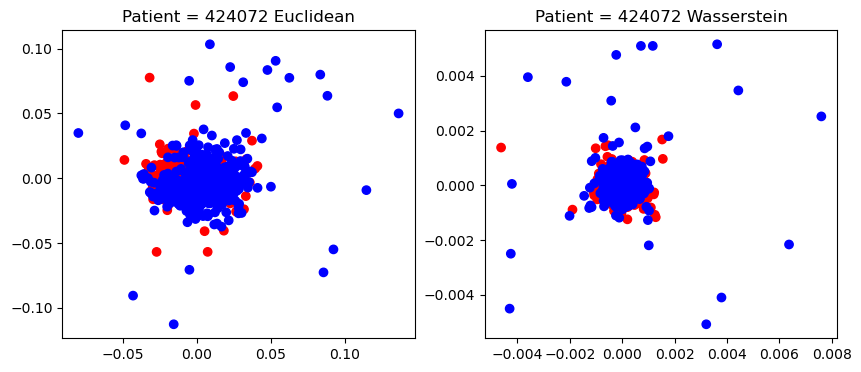

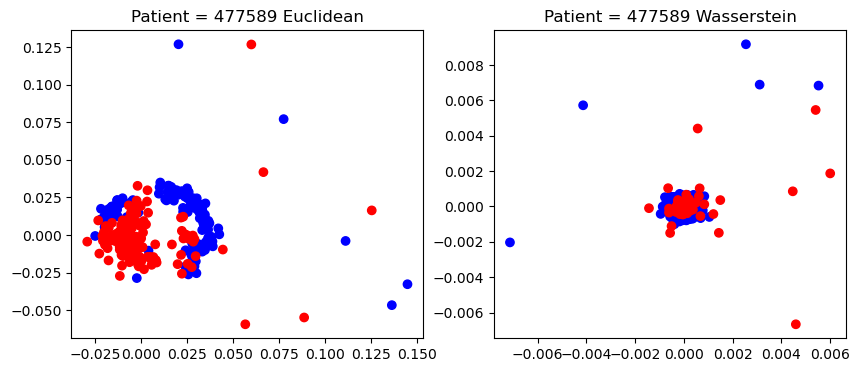

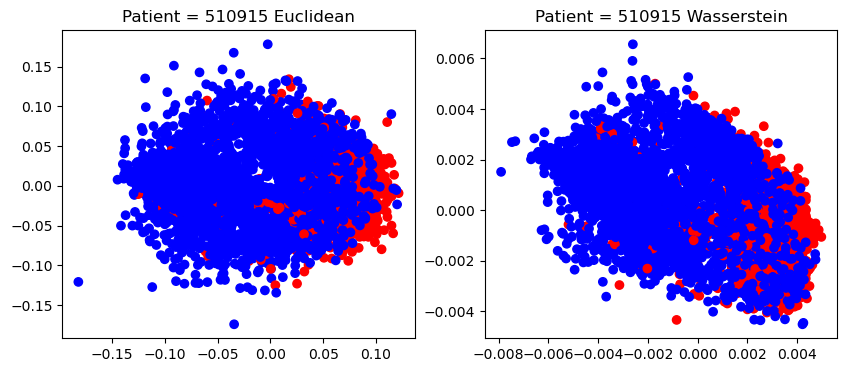

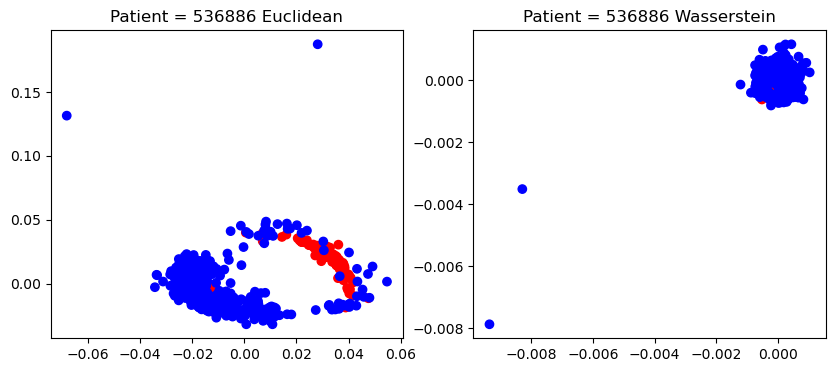

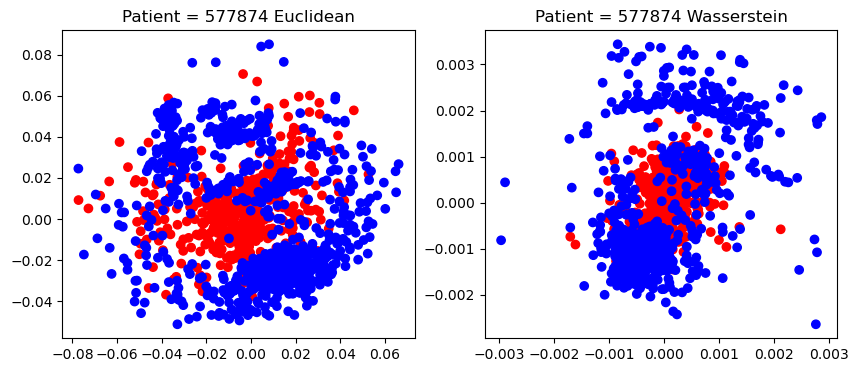

In [43]:
patients = patientMDSEuc.keys()
for i in patients:
    print(i)
    figure, axis = plt.subplots(1, 2, figsize = (10,4)) 
    axis[0].scatter(patientMDSEuc[i][:,0], patientMDSEuc[i][:,1], c = patientColorLabels[i]) 
    axis[0].set_title("Patient = " + str(i) + " Euclidean") 
    
    axis[1].scatter(patientMDSWass[i][:,0], patientMDSWass[i][:,1], c = patientColorLabels[i]) 
    axis[1].set_title("Patient = " + str(i) + " Wasserstein") 

In [18]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


In [24]:
# Craete a test of the KMeans algorithm
testArr = patientArrays[424072]
testLabels = patientLabels[424072]
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(testArr)
centroid = kmeans.cluster_centers_[0]
distArray = []
for beat in testArr:
    distArray.append(np.linalg.norm(beat - centroid))


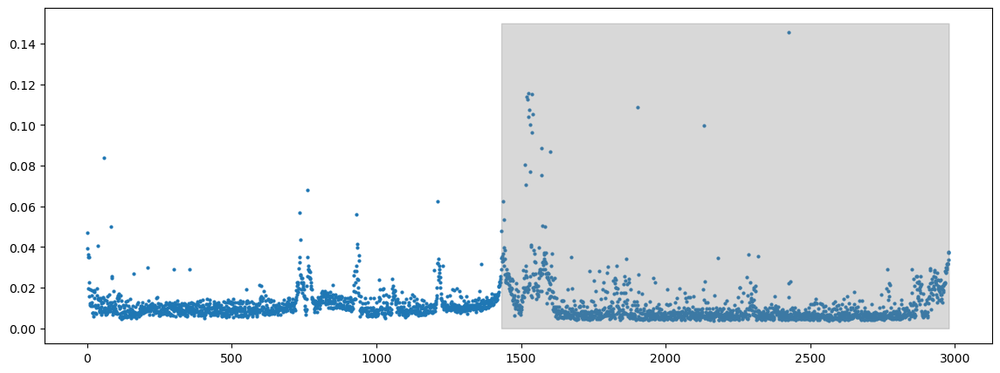

In [135]:
fig, ax = plt.subplots(figsize=(14, 5))
ax.scatter(np.linspace(1, len(distArray), len(distArray)),distArray, s = 4)
ax.fill_between(np.linspace(1, len(distArray), len(distArray)), 0, 0.15, where=testLabels == 1, color = 'grey', alpha=0.3)

In [22]:
#Create function to perform KMeans clustering
def kmeansPlot(patient):
    testArr = patientArrays[patient]
    testLabels = patientLabels[patient]
    kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(testArr)
    centroid = kmeans.cluster_centers_[0]
    distArray = []
    for beat in testArr:
        distArray.append(np.linalg.norm(beat - centroid))
        
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.scatter(np.linspace(1, len(distArray), len(distArray)),distArray, s = 4)
    ax.fill_between(np.linspace(1, len(distArray), len(distArray)), 0, np.max(distArray), where = testLabels == 1, color = 'grey', alpha=0.3)
    #ax.set_title("Patient = " + str(patient))
    plt.xlabel("Heartbeat index")
    plt.ylabel("Distance to centroid")


### Perform Kmeans Clustering with k=2

c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:14

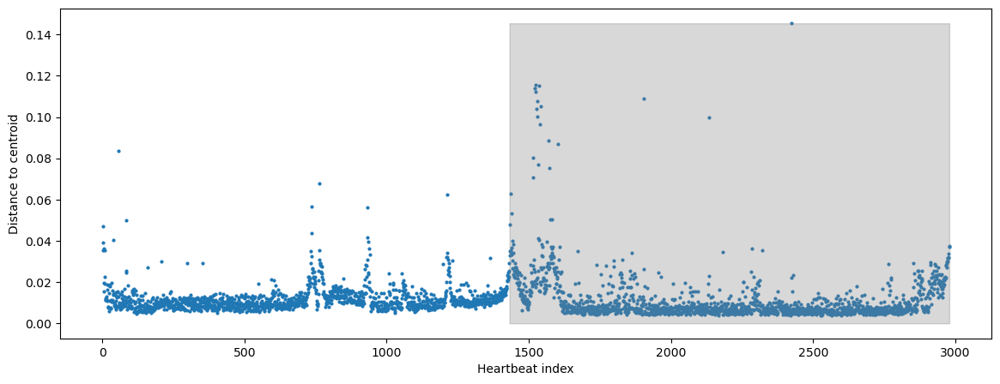

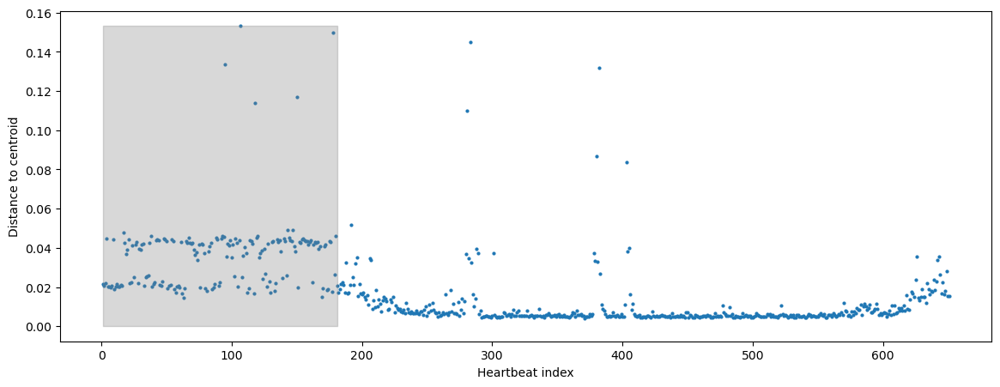

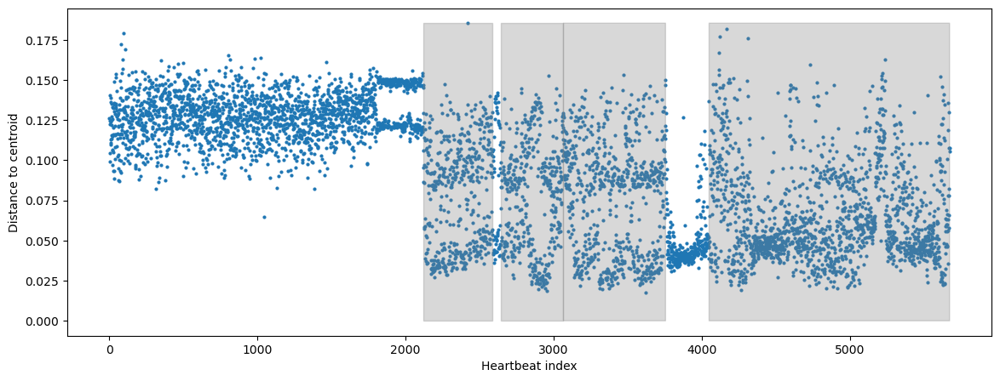

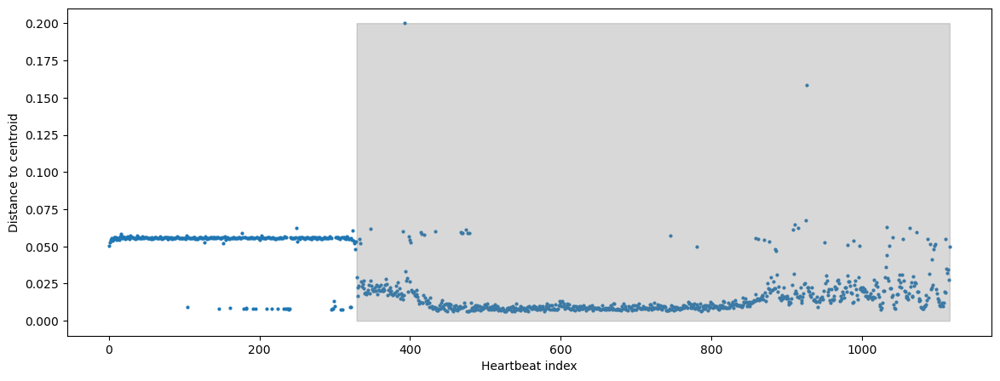

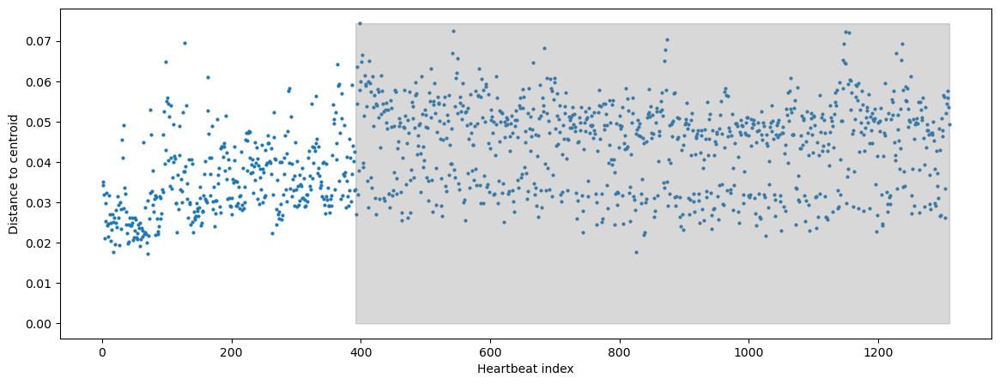

...

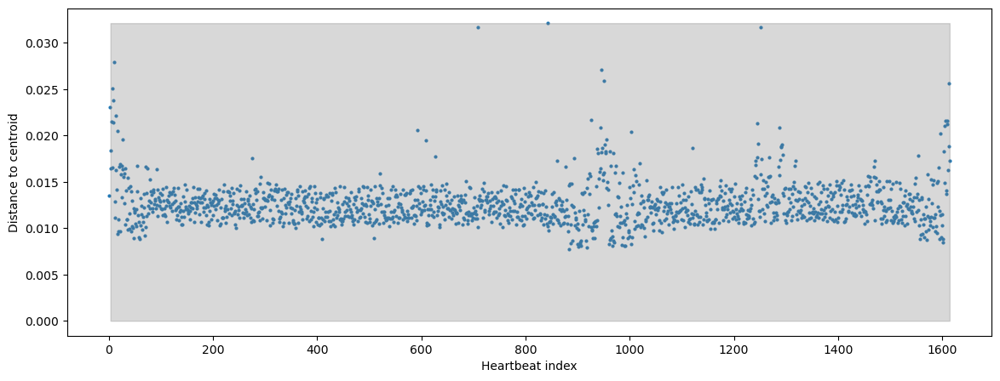

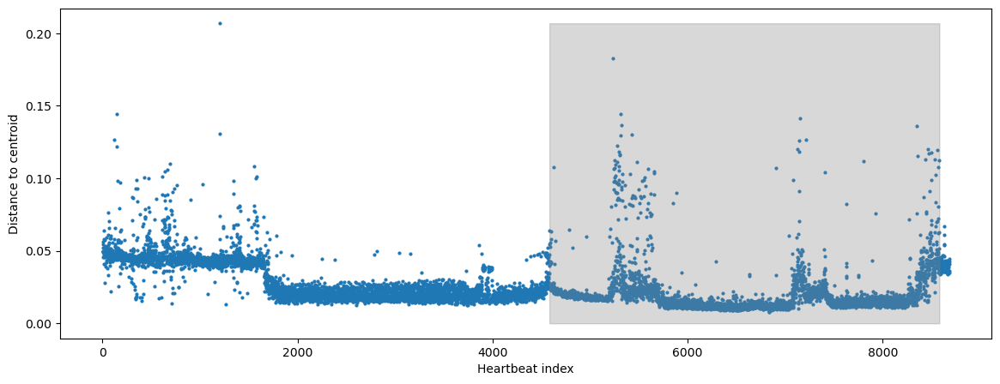

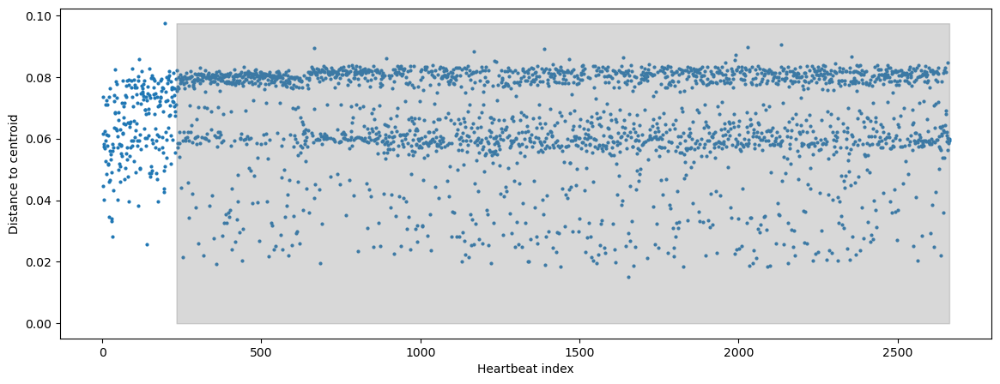

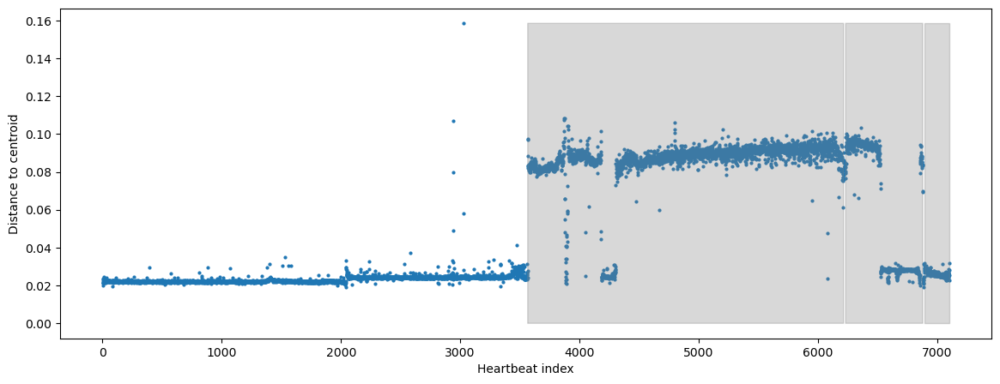

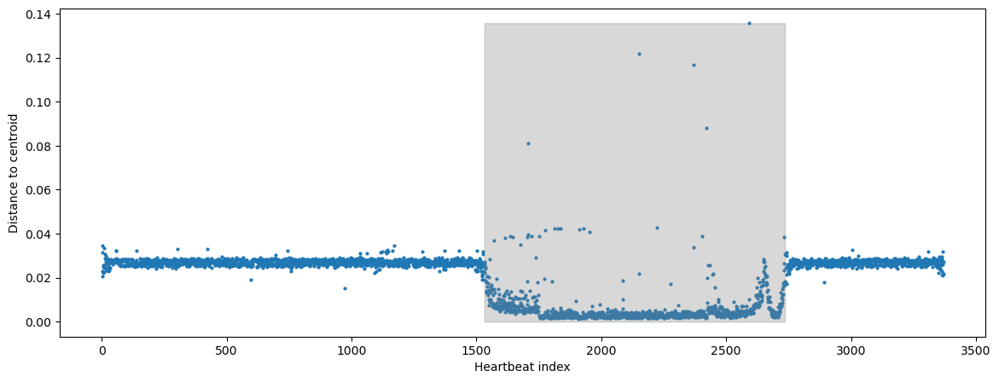

In [23]:
patients = patientArrays.keys()
for p in patients:
    kmeansPlot(p)

# Unsupervised Kmeans with euclidean

c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\fanga\Anaconda3\envs\python-env\Lib\site-packages\sklearn\cluster\_kmeans.py:14

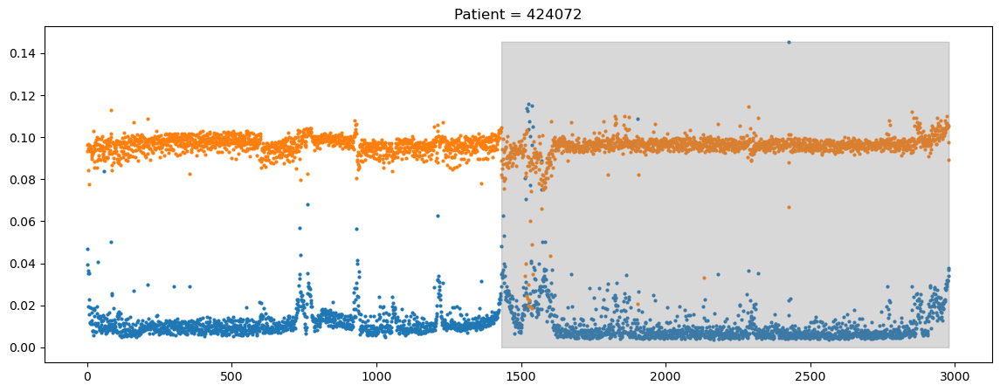

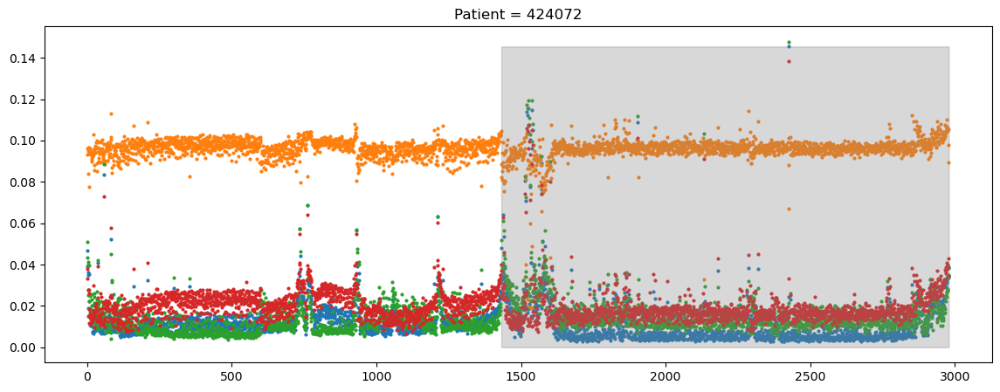

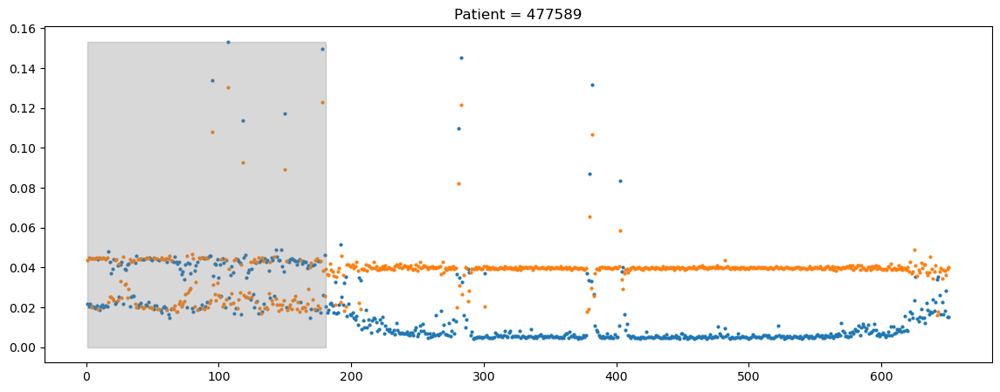

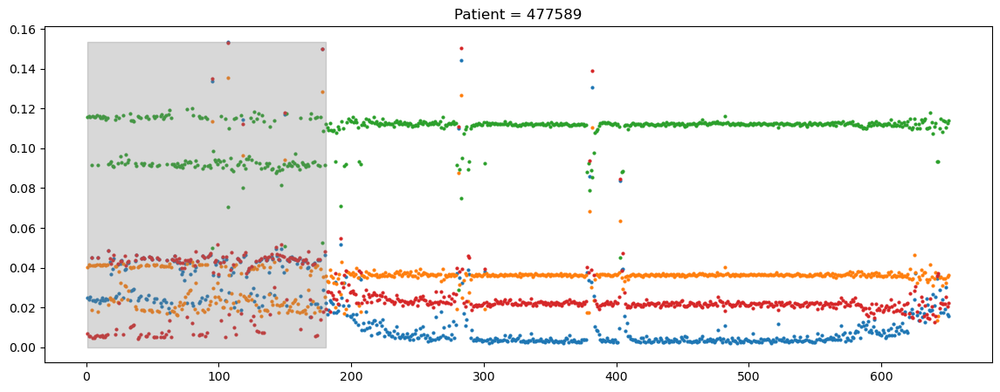

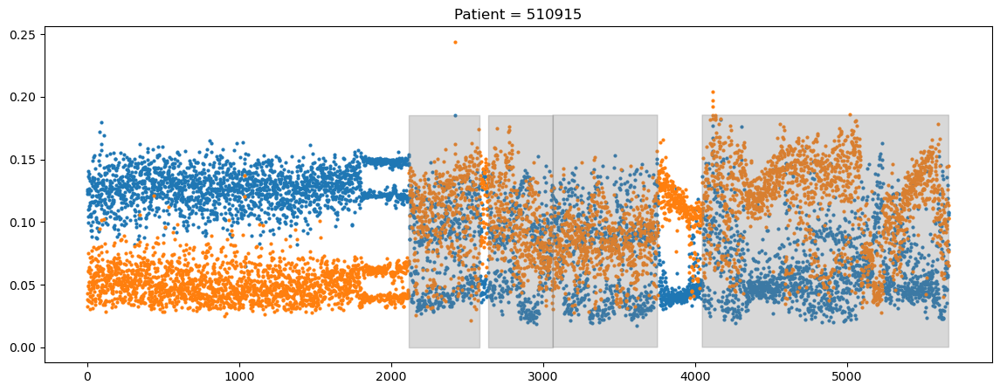

...

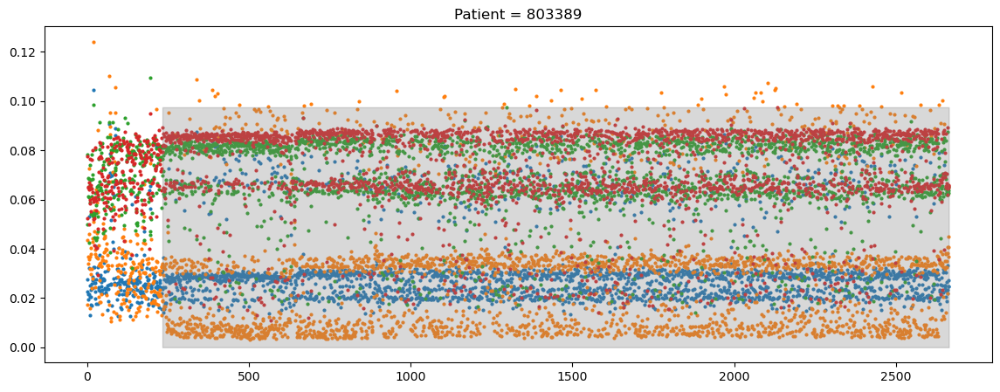

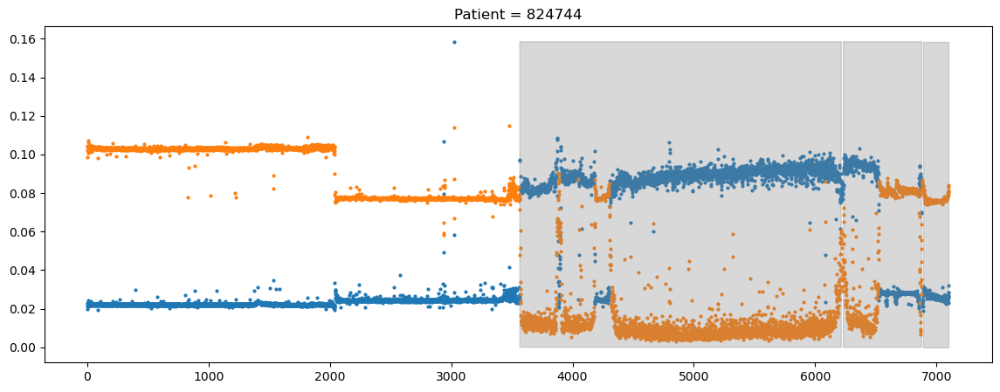

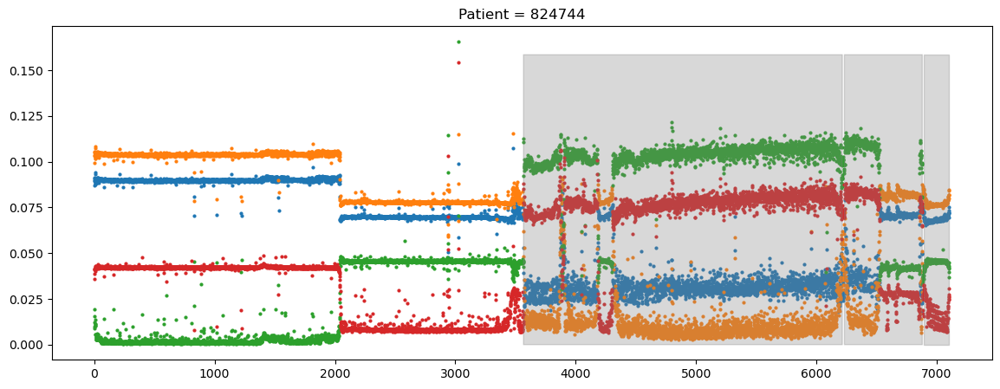

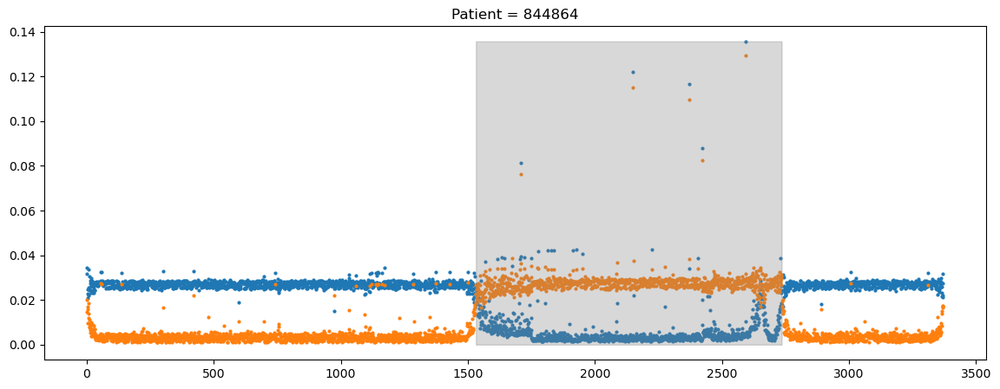

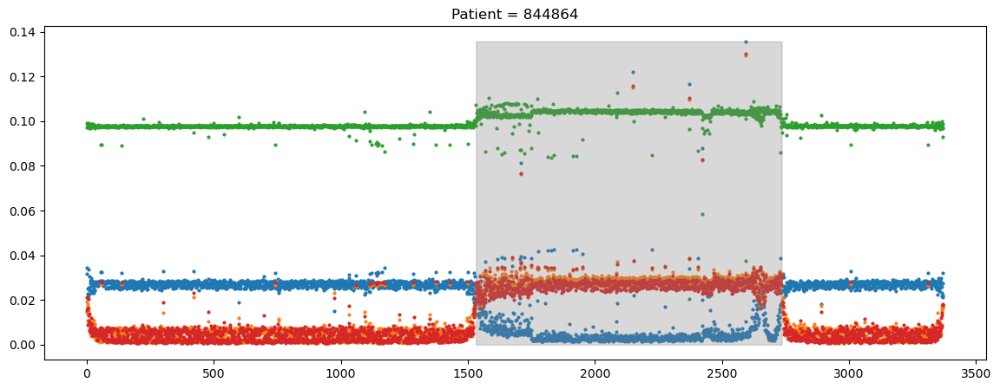

In [47]:
# Store euclidean knn distances

knn2Euc = {}
knn4Euc = {}

for patient in patientArrays:

    testArr = patientArrays[patient]
    testLabels = patientLabels[patient]
    kmeans2 = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(testArr)
    kmeans4 = KMeans(n_clusters=4, random_state=0, n_init="auto").fit(testArr)
    
    centroid1 = kmeans2.cluster_centers_[0]
    centroid2 = kmeans2.cluster_centers_[1]
    
    centroid3 = kmeans4.cluster_centers_[0]
    centroid4 = kmeans4.cluster_centers_[1]
    centroid5 = kmeans4.cluster_centers_[2]
    centroid6 = kmeans4.cluster_centers_[3]
    
    dist1 = []
    dist2 = []
    
    dist3 = []
    dist4 = []
    dist5 = []
    dist6 = []
    
    for beat in testArr:
        dist1.append(np.linalg.norm(beat - centroid1))
        dist2.append(np.linalg.norm(beat - centroid2))
        
        dist3.append(np.linalg.norm(beat - centroid3))
        dist4.append(np.linalg.norm(beat - centroid4))
        dist5.append(np.linalg.norm(beat - centroid5))
        dist6.append(np.linalg.norm(beat - centroid6))
        
    knn2Euc[patient] = np.vstack((dist1,dist2))
    knn4Euc[patient] = np.vstack((dist3,dist4, dist5, dist6))
        
        
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.scatter(np.linspace(1, len(dist1), len(dist1)),dist1, s = 4)
    ax.scatter(np.linspace(1, len(dist2), len(dist2)),dist2, s = 4)
    ax.fill_between(np.linspace(1, len(dist1), len(dist1)), 0, np.max(dist1), where = testLabels == 1, color = 'grey', alpha=0.3)
    ax.set_title("Patient = " + str(patient))
    
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.scatter(np.linspace(1, len(dist1), len(dist1)),dist3, s = 4)
    ax.scatter(np.linspace(1, len(dist1), len(dist1)),dist4, s = 4)
    ax.scatter(np.linspace(1, len(dist1), len(dist1)),dist5, s = 4)
    ax.scatter(np.linspace(1, len(dist2), len(dist2)),dist6, s = 4)
    ax.fill_between(np.linspace(1, len(dist1), len(dist1)), 0, np.max(dist1), where = testLabels == 1, color = 'grey', alpha=0.3)
    ax.set_title("Patient = " + str(patient))

# Supervised KMeans with both Euclidean and Wasserstein distances. 

In [49]:
knn2SupEuc = {}
knn2SupWass = {}

#compute Cost Matrix
costMat = ot.utils.dist0(beatsJetCentered.shape[1])
costMat /= costMat.max()

for patient in patientArrays:
    
    jetIdx = np.where(patientLabels[patient] == 1) 
    sinusIdx = np.where(patientLabels[patient] == 0)
    
    jetBeats = patientArrays[patient][jetIdx]
    sinusBeats = patientArrays[patient][sinusIdx]
    
    centEuc1 = np.mean(sinusBeats, axis=0)
    centEuc2 = np.mean(jetBeats, axis=0)
    
    cenWass1 = ot.barycenter(sinusBeats.T, costMat, 0.001)
    cenWass2 = ot.barycenter(jetBeats.T, costMat, 0.001)
    
    eucDist = np.zeros((2, len(patientArrays[patient]) ))
    wassDist = np.zeros((2, len(patientArrays[patient]) ))
    
    for i in range(len(patientArrays[patient])):
        eucDist[0,i] = np.linalg.norm(patientArrays[patient][i] - centEuc1)
        eucDist[1,i] = np.linalg.norm(patientArrays[patient][i] - centEuc2)
        
        
        wassDist[0,i] = ot.wasserstein_1d(patientArrays[patient][i], cenWass1)
        wassDist[1,i] = ot.wasserstein_1d(patientArrays[patient][i], cenWass2)
    
    knn2SupEuc[patient] = eucDist
    knn2SupWass[patient] = wassDist

C:\Users\fanga\AppData\Local\Temp\ipykernel_22340\3754639115.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(14, 5))


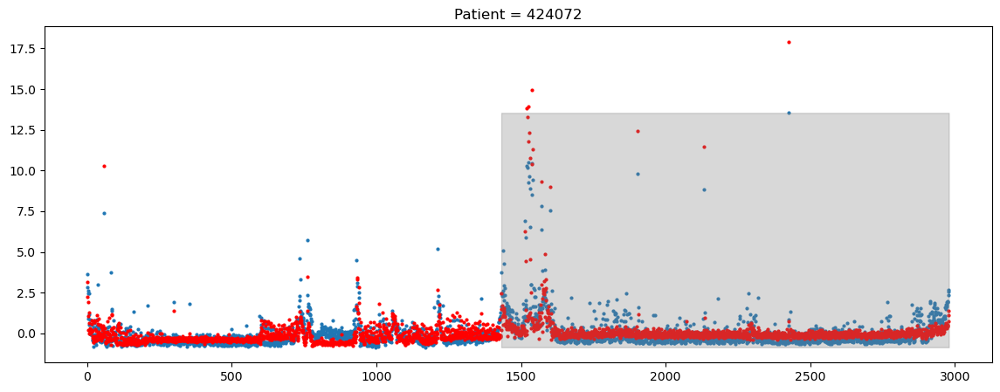

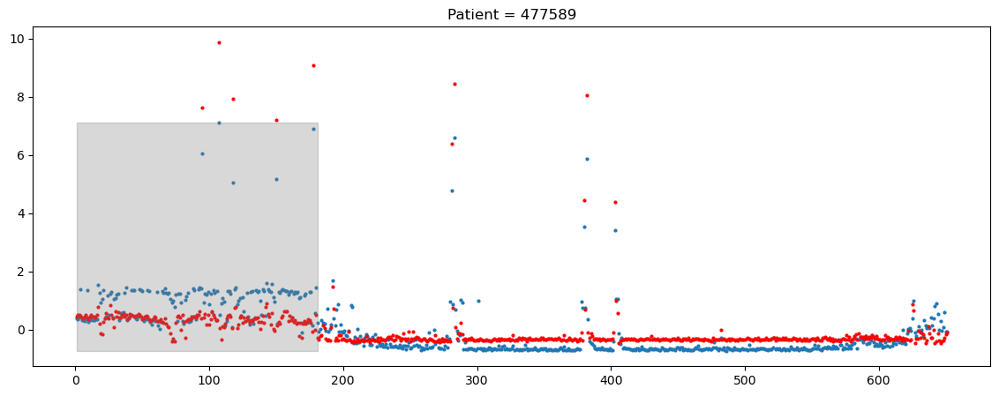

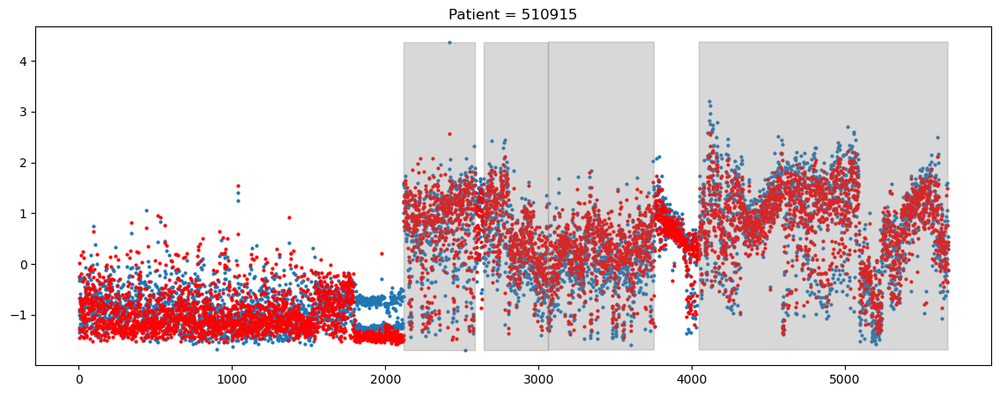

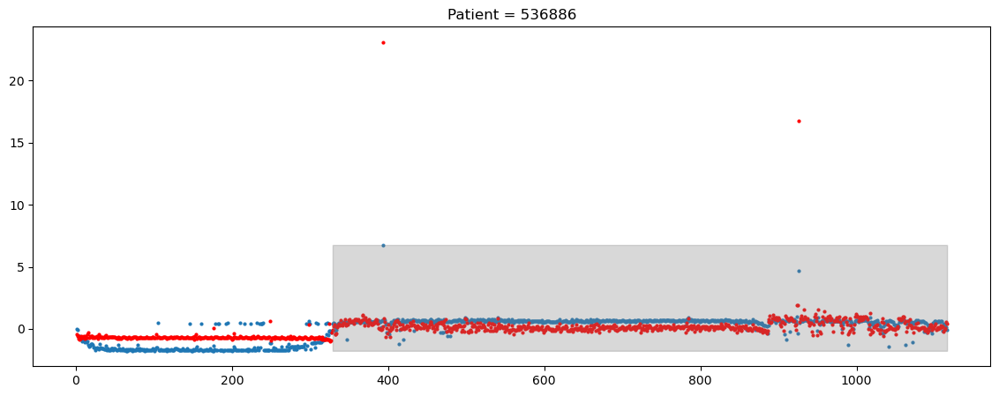

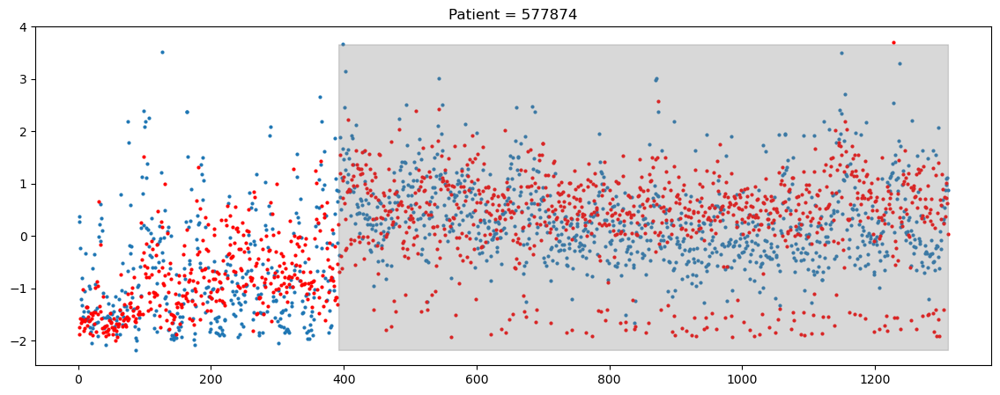

...

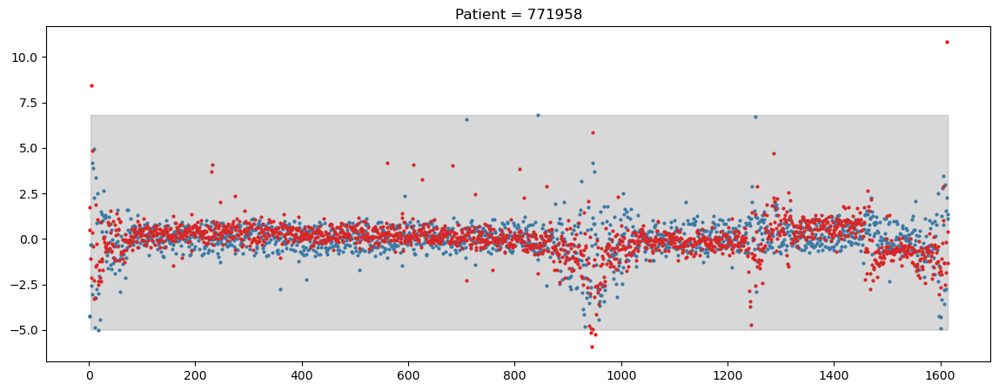

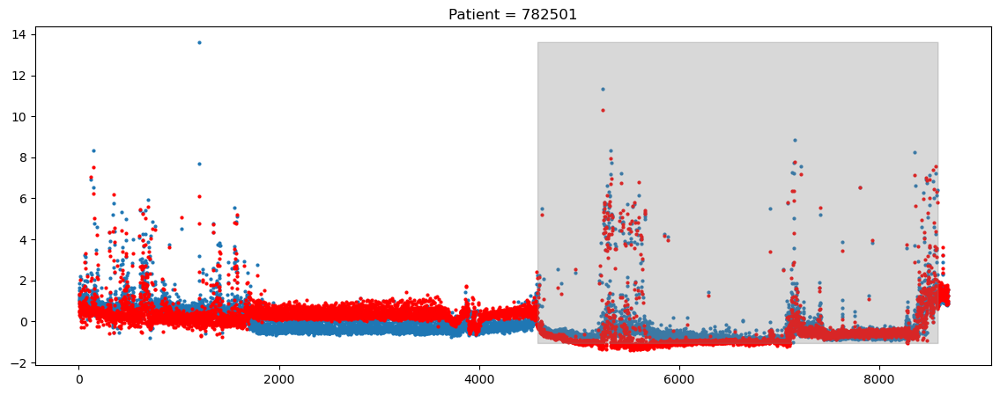

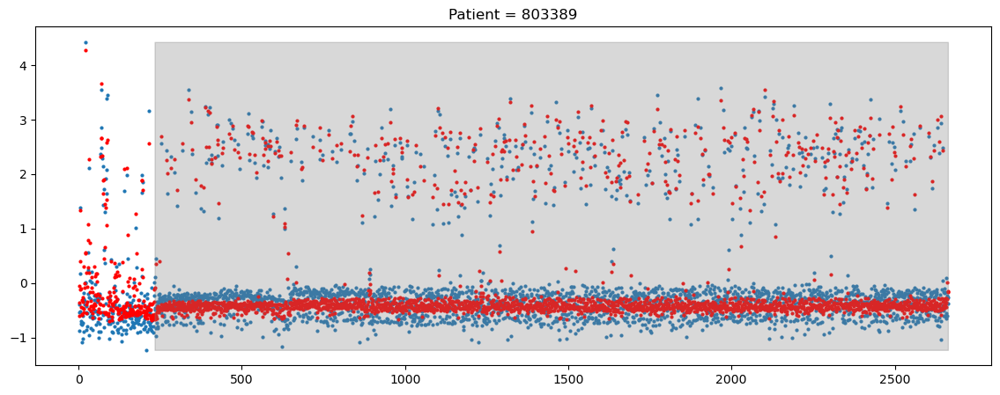

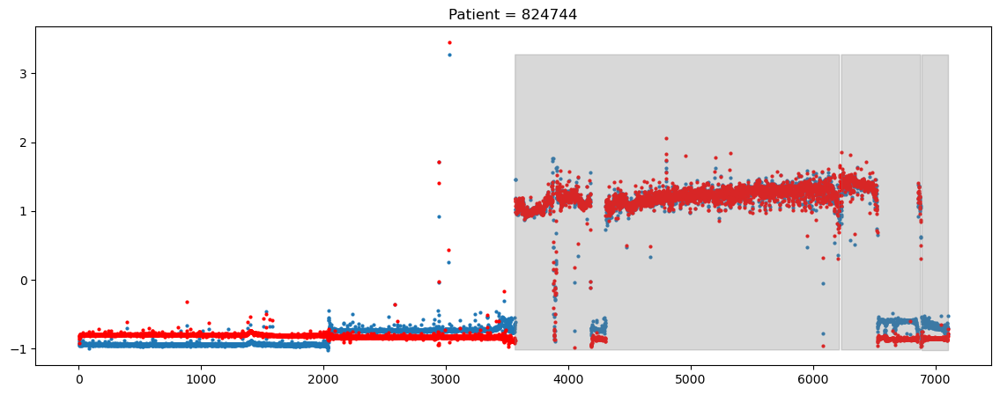

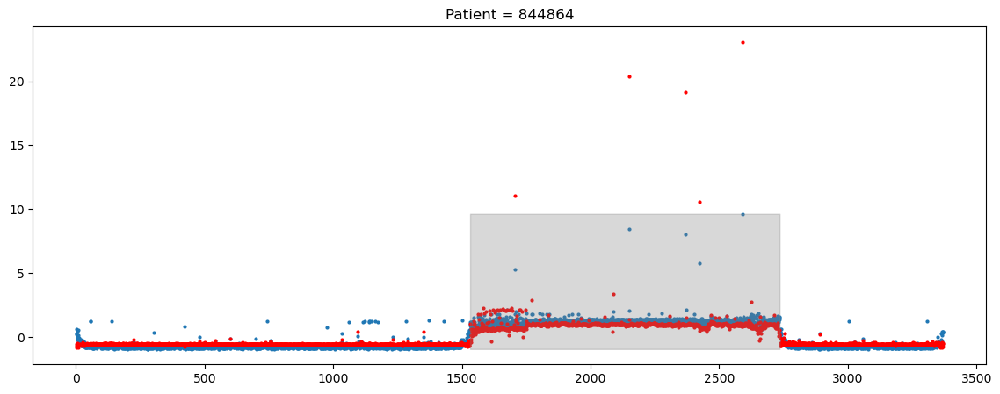

In [65]:
for patient in knn2SupEuc:
    distArr2 = knn2SupEuc[patient][0,:]
    wassDist = knn2SupWass[patient][0,:]
    testLabels = patientLabels[patient]
    
    distArr2 = (distArr2 - np.mean(distArr2))/np.std(distArr2)
    wassDist = (wassDist -   np.mean(wassDist))/np.std(wassDist)
    
    
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.scatter(np.linspace(1, len(distArr2), len(distArr2)),distArr2, s = 4)
    ax.scatter(np.linspace(1, len(distArr2), len(distArr2)),wassDist, s = 4, c = 'r')
    ax.fill_between(np.linspace(1, len(distArr2), len(distArr2)), np.min(distArr2), np.max(distArr2), where = testLabels == 1, color = 'grey', alpha=0.3)
    ax.set_title("Patient = " + str(patient))